**Lab 4: FIR filters and envelopes**

The goal of this lab is to learn how to implement FIR filters in Python, and how we can use them to improve our synthesis.

In [5]:
import os
import numpy as np
import librosa
import IPython.display as ipd
from scipy import signal
import matplotlib.pyplot as plt

from util import load_audio, plot_signals, plot_spectrogram, plot_mean_spectrogram

In [ ]:
import os, sys

if not os.path.exists("sis1_group7"):
    !git clone https://github.com/BradDanAlexandru/sis1_group7.git

sys.path.insert(0, "sis1_group7") #lol

**1. Overview of Filtering**

For this lab, we will define an FIR filter as a discrete-time system that converts an input signal $x[n]$ into an output signal $y[n]$ by means of the weighted summation:

$$
y[n] = \sum_{k=0}^M b_kx[n-k]
$$

The function *np.convolve()* is a generic function with which to implement FIR filters. The following code implements a three-point averaging system:

In [6]:
fs = 1
x = [np.floor(x/10) for x in range(50)]
b = np.array([1.0/3, 1.0/3, 1.0/3])
y = np.convolve(b, x)

plot_signals([x, y], fs, name=['input x[n]', 'output y[n]'], mode='lines+markers')

1.1 Explain the filtering action of the 5-point averager by comparing the plot of the input $x[n]$ and the output $y[n]$. This filter might be called a “smoothing” filter. Note how the transitions from one level to another have been “smoothed.”

The 5-point averager, is used to smooth or average a signal. It operates by averaging the current sample and four previous samples from the input signal to create a smoother output. This filtering action reduces the impact of high-frequency noise and sharp transitions in the input. We can see this from the example above by noteching how the transitions last longer and have less of an angle of attack. It's an overall smoother graphic than the blue one.

*1.2* Define a function `averaging_filter(x, N)` which implements the N-points averaging filter using the `np.convolve` function.

In [7]:
import numpy as np

def averaging_filter(x, N):
    """
    Applies a N-point averaging filter to the input signal x

    Parameters
    ----------
    x : np.array
        The input signal in the form of a numpy array
    N : int
        The number of points used in N-point averaging filter

    Returns
    -------
    y : np.array
        The output of the filter
    """
    b= [1/N]*N
    y=np.convolve(b,x, mode = "full")
    return y




1.3 Run the example above using the `averaging_filter` instead. Change the number N to different values and explain what happen.

In [8]:
# Write your code here
y0=averaging_filter(x,100)
plot_signals([x, y0], fs, name=['input x[n]', 'output y0[n]'], mode='lines+markers')

In [9]:
y1=averaging_filter(x,30)
plot_signals([x, y1], fs, name=['input x[n]', 'output y1[n]'], mode='lines+markers')

1.4 How would you classify this filter, as a low-pass o high-pass filter?


it smooths the signal by averaging a range of samples, which effectively reduces the impact of high-frequency noise or rapid changes in the signal. This behavior makes it a low-pass filter, as it passes the lower-frequency components and attenuates the higher-frequency components, resulting in a smoother signal.







---

**2. Envelope detector**

Now we'll implement an envelope detector by concatenating two systems: a full-wave rectifier (absolute value) and the N-point averaging filter.

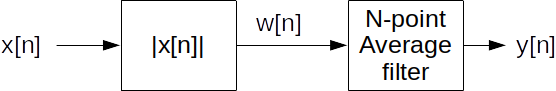

2.1 Define a function `envelope(x, N)` which applies an N-point averaging filter to the full-wave rectified signal and returns the output $y[n]$.

**Note 1**: to calculate the full-wave rectified signal check the `np.abs()` function.

**Note 2**: The output should have the same length as the input signal. Use 'same' mode (see [np.convolve](https://numpy.org/doc/stable/reference/generated/numpy.convolve.html) documentation).

In [10]:
import numpy as np

def envelope(x, N):
    """
    Extracts the envelope of the input signal x by concatenating a full-wave rectifier and an N-point averaging filter.

    Parameters
    ----------
    x : np.array
        The input signal in the form of a numpy array
    N : int
        The number of points used in N-point averaging filter

    Returns
    -------
    y : np.array
        The output of the system, i.e., the envelope of the signal x.
    """
    # write your code here
    full_wave=np.abs(x)
    y=averaging_filter(full_wave,N)
    return y


2.2 Load your reference signal and calculate its envelope using the function you designed. Plot the reference signal and envelope in the same figure.

In [11]:
filepath = "audio/136954__stomachache__gsharp1.wav"
ref, fs = load_audio(filepath)


In [12]:
envelope_signal1= envelope(ref, 1)
envelope_signal10= envelope(ref, 10)
envelope_signal100= envelope(ref, 100)
envelope_signal1000= envelope(ref, 1000)
plot_signals([ref,envelope_signal1, envelope_signal10,envelope_signal100,envelope_signal1000], fs, name=['Reference signal', 'N=1','N=10','N=100','N=1000'])

2.3 Change the number N to get a good result. What happens when you change the number N?

The bigger the N the smother the line will be as the envelope has a bigger window size nd will average the values more. A good envelope size is one that makes the line to be smooth but that clearly explains the trend of the original signal. In this case N=150 or 100 is a good option probably

2.4 Explain with your own words why this system achieves extracting the envelope. It might be useful to plot together the signals $x[n]$, $w[n]$ and $y[n]$.

In [25]:
x=ref
w=np.abs(x)
y=envelope(x,150)
plot_signals([x,w,y], fs, name=['Reference signal','absolute value of func', 'Envelope signal'])

The system extracts the envelope using a two-step process: applies abs() on the full wave and then applies a N-point averaging filter. First,  taking the absolute value, $w[n]=|x[n]|$ flips all negative signal components to positive, retaining the overall amplitude shape but still containing the fast-oscillating wave. Second, the N-point averaging filter acts as a low-pass filter, selectively smoothing the "absolute" signal. This filter removes the high-frequency carrier wave ripple while retaining the slower, low-frequency variations, which represent the signal's envelope $y[n]$. Thus, by eliminating the high-frequency components while preserving the amplitude trend, the system successfully isolates the envelope.

2.5 Now let's apply this envelope to the synthesized signal. Copy the code from Lab3 Ex. 2.1 and generate the synthesized signal. Then multiply the synthesized signal by the envelope. Note that both signal and envelope should have the same length. You can define a time vector of the same length of the envelope to create the signal:

In [26]:
# Write your code here
# Write your code here
from IPython.display import Audio
A = 0.0946
f0 = 416.037
fs = 44100
phi = ((0.317277-0.31608)/0.0024266)*2* np.pi #del ej 3.1 lab1
t = np.arange(len(ref))/fs
weights = [1, 0.0264, 0.0143, 0.032,0.005, 0.0005, 0.00095] # Fill this list with the measured weights
def synthesize(f0, phi, Ak, t):
  y = 0
  for k in range(1, len(Ak) + 1):
    y += Ak[k-1] * np.cos(2*np.pi*k*f0*t + k*phi - (k-1)*np.pi/2)
  return y

s= synthesize(f0, phi, weights, t)
s_n= s*y[0:78840]
plot_signals([ref, s_n], fs, name = ["reference signal", "synthesized signal"])

2.6. Compare the spectrograms of the reference signal and the synthesized signal. What are the main differences?

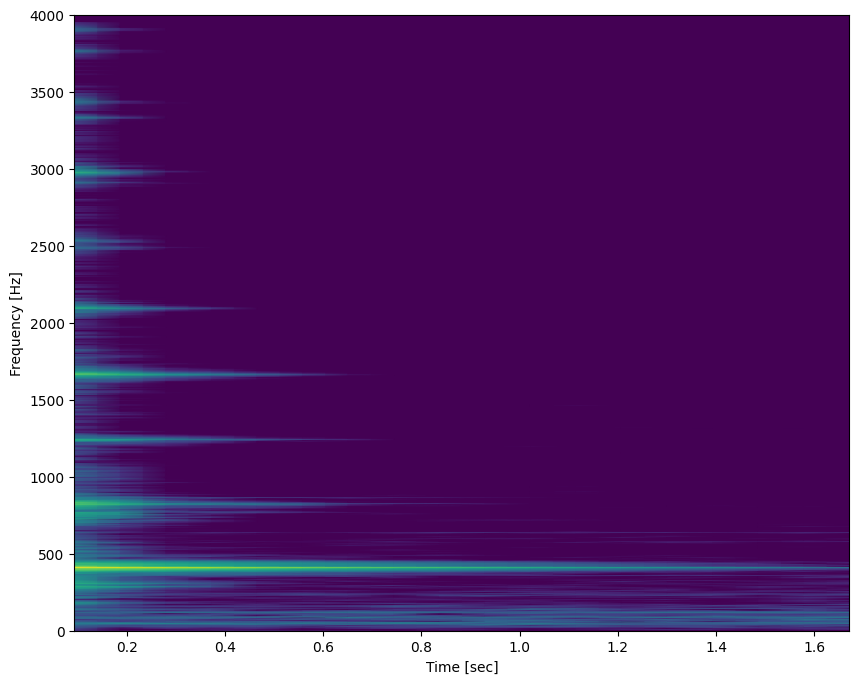

In [27]:
# Write your code here
window_length = 8192
ff, tt, S = signal.spectrogram(ref, fs, nperseg=window_length, noverlap=(window_length/2))
plt.figure(figsize=(10,8))
plot_spectrogram(ff, tt, S)
plt.ylim([0, 4000])
plt.show()

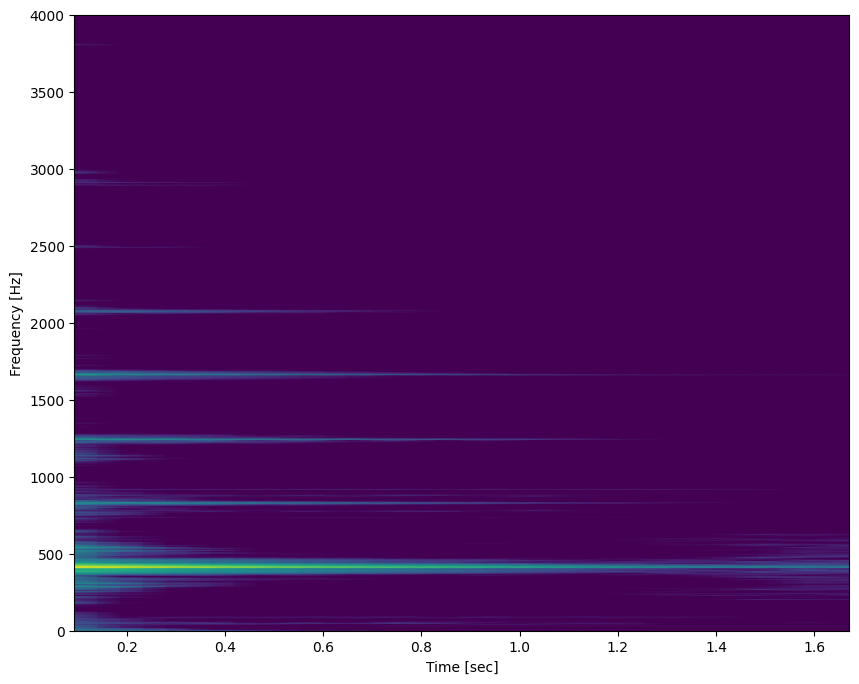

In [28]:
# Write your code here
window_length = 8192
ff, tt, S = signal.spectrogram(s_n, fs, nperseg=window_length, noverlap=(window_length/2))
plt.figure(figsize=(10,8))
plot_spectrogram(ff, tt, S)
plt.ylim([0, 4000])
plt.show()

We can see how in the original sound there are the same main frequency peaks as in the synhetic, but it also has a lot of peaks around the main ones making its spectogram very "dirty". Those peaks are basically interferences and noise from the recording of the original sound. Our synthetic sound has been applied a filter so that it keeps the main freuency peaks that makes the sound to be as it is, and avoiding to reply all that noise that the original one had.

2.7 Listen to the synthesized signal and compare it to the reference.



In [29]:
Audio(ref,rate=fs)

In [30]:
# Write your code here
Audio(s_n,rate=fs)